# 極座標と極方程式
## 準備
### 授業資料
- [本時のスライド](./main.pdf)

In [ ]:
!pip install japanize-matplotlib

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.1/4.1 MB 35.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for japanize-matplotlib: filename=japanize_matplotlib-1.1.3-py3-none-any.whl size=4120257 sha256=87af26161bd5e4b5a13b565d68a25ad44e5201bb421b031df0306c2cbf9643fe
  Stored in directory: /root/.cache/pip/wheels/61/7a/6b/df1f79be9c59862525070e157e62b08eab8ece27c1b68fbb94
Successfully built japanize-matplotlib


In [ ]:
# おまじない。1度実行しましょう
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.collections
import matplotlib.animation
import matplotlib.colors
import japanize_matplotlib
import math
from IPython.display import HTML

# おまじないその2
## 曲座標→デカルト座標
def coordinate(r, theta):
  x = r * np.cos(theta)
  y = r * np.sin(theta)
  return x, y

def draw_step(ax, r, theta):
    artist = []
    x, y = coordinate(r, theta)
    artist.extend(ax.plot(x, y, 'ro'))
    artist.extend(ax.plot([0, x], [0, y], color='blue', linestyle='--'))
    artist.append(ax.text(x, y, r"$r = {:5f}$".format(r) + "\n"+ r"$\theta = {:4f}$".format(theta), ha='right'))
    return artist

## 復習／媒介変数表示
### サイクロイドの例(早めに実装します)
サイクロイドの媒介変数表示は次のようになっていました。
\begin{equation*}
    \begin{cases}
        x = a(\theta - \sin \theta) & \\
        y= a(1-\cos \theta) &
    \end{cases}
\end{equation*}
これを$\theta$の変化がわかるように描くと次の図のようになります。

'\n# animation drawing section\nartists = []\nfor t in thetas:\n\n  artists.append(draw_step(ax, f(t), t))\n\nani = matplotlib.animation.ArtistAnimation(fig, artists, interval=500)\nhtml = ani.to_jshtml()\nplt.close(fig)\nHTML(html)\n'

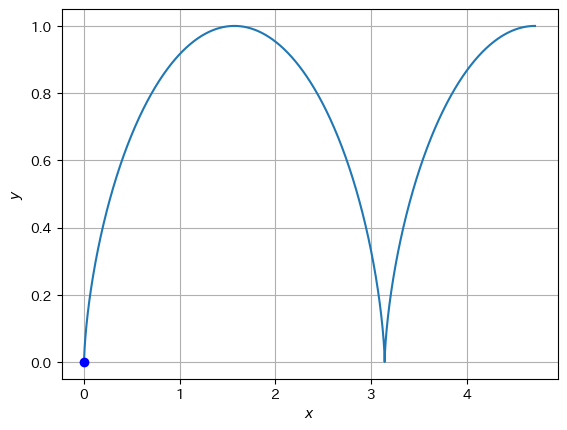

In [ ]:
# aの値と離心率（いろいろ変更してどのように変化するか見てみよう！）
a = 0.5
e = 0.8

## 描画の細かさ (θの幅指定。細かくしたければここの値を小さくすれば良いです)
stp = 0.2

# 極方程式
def f(x):
  return a * (x - np.sin(x)), a * (1 - np.cos(x))

stp_line = 0.00001
# 双曲線は発散するから描画範囲を限定している

theta = np.arange(0, 3 * np.pi, stp_line)
thetas = np.arange(0, 3 * np.pi, stp)

# base figure
X,Y = f(theta)
fig, ax = plt.subplots()
ax.plot(X, Y)
ax.plot(0,0, 'o', color = 'b')
ax.set_xlabel('$x$')
ax.set_ylabel('$y$')
ax.grid()
fig.show()
"""
# animation drawing section
artists = []
for t in thetas:

  artists.append(draw_step(ax, f(t), t))

ani = matplotlib.animation.ArtistAnimation(fig, artists, interval=500)
html = ani.to_jshtml()
plt.close(fig)
HTML(html)
"""

##  極方程式
```{admonition} 極方程式
曲線が極座標$(r, \theta)$によって、$f(r,\theta)=0$($r$と$\theta$の式$= 0$)の形で書かれるとき、この方程式を曲線の**極方程式**という。
```
極方程式では、
- 図形のイメージを掴む
- 複数の点をプロットすることによって概形を描けるようになる

ことが習得の鍵になるでしょう。

では実際の例を見てみましょう。

### 直線と円

### 原点を通る直線
同型方向となす角が一定な直線上の点の軌跡と見ることができるので、
\begin{equation}
  \theta = (定数)
\end{equation}
になります。
#### 原点を中心とする円
円の場合は極からの距離が等しい点の軌跡と見ることができるので、
\begin{equation}
    r = (定数)
\end{equation}
になります。

### 二次曲線
二次曲線$C$の焦点を極とする極座標において、$C$の極方程式は
\begin{equation}
  r=\frac{ae}{1-e\cos \theta}
\end{equation}
です。ここで$e$は離心率と呼ばれ、
- $0<e<1 \to$ 楕円
- $e=1\to$ 放物線
- $e > 1 \to$ 双曲線

になります。

では実際に図で表すとどんな感じになるか見てみましょう。
```{caution}
$e\geqq 1$の時、つまり双曲線、放物線の場合には発散してしまうので、$\frac{\pi}{4}\leqq \theta \leqq \frac{7\pi}{4}$で表示している。
```

以下では、
\begin{align*}
    \begin{cases}
        a=0.5 & \\
        e = 0.5 &
    \end{cases}
\end{align*}
で描画しています。

In [ ]:
# aの値と離心率（いろいろ変更してどのように変化するか見てみよう！）
a = 0.5
e = 0.8

## 描画の細かさ (θの幅指定。細かくしたければここの値を小さくすれば良いです)
stp = 0.2

# 極方程式
def f(x):
  return a / (1 - e * np.cos(x))

stp_line = 0.00001
# 双曲線は発散するから描画範囲を限定している
if e >= 1:
  theta = np.arange(np.pi/4, 7 * np.pi / 4, stp_line)
  thetas = np.arange(np.pi/4, 7 * np.pi / 4, stp)
  r = a / (1 - e * np.cos(theta))
  hyp = 1
else:
  theta = np.arange(0, 2 * np.pi, stp_line)
  thetas = np.arange(0, 2 * np.pi, stp)

# base figure
X,Y = coordinate(f(theta), theta)
fig, ax = plt.subplots()
ax.plot(X, Y)
ax.plot(0,0, 'o', color = 'b')
ax.text(0,0.01, "焦点")
ax.set_xlabel('$x$')
ax.set_ylabel('$y$')
ax.grid()

# animation drawing section
artists = []
for t in thetas:
  artists.append(draw_step(ax, f(t), t))

ani = matplotlib.animation.ArtistAnimation(fig, artists, interval=500)
html = ani.to_jshtml()
plt.close(fig)
HTML(html)

```{adomonition} 演習
上の図において、極方程式の$a$と$e$の値を変更して、図形がどのように変化するか確認してみよう。
```

### アルキメデスの螺旋
アルキメデスの螺旋は、
\begin{equation}
    r = \alpha \theta
\end{equation}
で書かれます。

In [ ]:
alpha = 1
stp = 0.2

stp_line = 0.00001
max_range = 6 * np.pi
theta = np.arange(0, max_range, stp_line)
thetas = np.arange(0, max_range, stp)
def f(x):
  return a * x

# base figure
X,Y = coordinate(f(theta), theta)
fig, ax = plt.subplots()
ax.plot(X, Y)
ax.plot(0,0, 'o', color = 'b')
ax.text(0,0.01, "極")
ax.set_xlabel('$x$')
ax.set_ylabel('$y$')
ax.grid()

# animation drawing section
artists = []
for t in thetas:
  artists.append(draw_step(ax, f(t), t))

ani = matplotlib.animation.ArtistAnimation(fig, artists, interval=500)
html = ani.to_jshtml()
plt.close(fig)
HTML(html)

```{adomonition} 演習
上の図において極方程式の$\alpha$の値を変更して、図形がどのように変化するか確認してみよう。
```

(cardioid)=
### カージオイド
カージオイドの極方程式は
\begin{equation}
    r=a(1\pm \cos \theta) \quad {または} \quad r=a(1\pm \sin \theta)
\end{equation}
と表されます。

以下では、$r=a(1+\cos \theta)$として描いています。これも$a$の値や$\pm$を変えて図形の変化を見てみましょう。

In [ ]:
a = 1
is_positive = 1
is_cos = 1
stp = 0.1

stp_line = 0.00001
max_range = 2 * np.pi
theta = np.arange(0, max_range, stp_line)
thetas = np.arange(0, max_range, stp)
def f(x):
  return a * (1 + (np.cos(x) if is_cos else np.sin(x))) * (1 if is_positive else -1)

# base figure
X,Y = coordinate(f(theta), theta)
fig, ax = plt.subplots()
ax.plot(X, Y)
ax.plot(0,0, 'o', color = 'b')
ax.text(0,0.01, "極")
ax.set_xlabel('$x$')
ax.set_ylabel('$y$')
ax.grid()

# animation drawing section
artists = []
for t in thetas:
  artists.append(draw_step(ax, f(t), t))

ani = matplotlib.animation.ArtistAnimation(fig, artists, interval=500)
html = ani.to_jshtml()
plt.close(fig)
HTML(html)

### 正葉曲線
正葉曲線は
\begin{equation}
    r=a\sin n \theta \quad \text{または} \quad r = a\cos n \theta
\end{equation}
の形で書かれます。ここで$n$は整数です。が、有理数なら図形が描けます。

下の図はひとまず$r=a\sin n \theta$ですが、コード中の`is_cos = 0`を`is_cos = 1`に変更してどんな図形になるか観察してみましょう。

In [ ]:
# 各値の指定
a = 1
n = 2
# r = a cos nθにするかどうかの指定。is_cos = 1ならr = a cos nθになる。
is_cos = 0
# アニメーションの細かさ
stp = 0.2

stp_line = 0.00001
theta = np.arange(0, 2 * np.pi, stp_line)
thetas = np.arange(0, 2 * np.pi, stp)
def f(x):
  return a * (np.cos(n*x) if is_cos else np.sin(n * x))

# base figure
X,Y = coordinate(f(theta), theta)
fig, ax = plt.subplots()
ax.plot(X, Y)
ax.plot(0,0, 'o', color = 'b')
ax.text(0,0.01, "極")
ax.set_xlabel('$x$')
ax.set_ylabel('$y$')
ax.grid()

# animation drawing section
artists = []
for t in thetas:
  artists.append(draw_step(ax, f(t), t))

ani = matplotlib.animation.ArtistAnimation(fig, artists, interval=500)
html = ani.to_jshtml()
plt.close(fig)
HTML(html)

````{adomonition} 演習
極方程式の$a$と$n$の値を変更して、図形がどのように変化するか確認してみよう。
  ```{admonition} 発展
  $n$の値を有理数に拡張してみると、図形はどのように変化するだろうか。実際に変更して試した上で、どうしてそのような付けになるのか、数式的に説明してみよう。
  ```
````

### リマソン(パスカルの蝸牛形)
リマソンは
\begin{equation}
  r = a + b \cos \theta
\end{equation}
で表される図形です。特に$a=b$のとき、先に見た[カージオイド](#cardioid)になります。

実際に図を見てみましょう。

In [ ]:
# 各値の指定
a = 1
b = 2

# アニメーションの細かさ
stp = 0.2

stp_line = 0.00001
theta = np.arange(0, 2 * np.pi, stp_line)
thetas = np.arange(0, 2 * np.pi, stp)
def f(x):
  return a + b * np.cos(x)

# base figure
X,Y = coordinate(f(theta), theta)
fig, ax = plt.subplots()
ax.plot(X, Y)
ax.plot(0,0, 'o', color = 'b')
ax.text(0,0.01, "極")
ax.set_xlabel('$x$')
ax.set_ylabel('$y$')
ax.grid()

# animation drawing section
artists = []
for t in thetas:
  artists.append(draw_step(ax, f(t), t))

ani = matplotlib.animation.ArtistAnimation(fig, artists, interval=500)
html = ani.to_jshtml()
plt.close(fig)
HTML(html)

### レムニスケート
レムニスケートは
\begin{equation}
    r^2 = a^2 \cos 2\theta
\end{equation}
で表されます。こう書かれるとどんな図形か全くわからないので、とりあえず描いてみます。

In [ ]:
alpha = 1
stp = 0.2

stp_line = 0.00001
max_range = 2 * np.pi
theta = np.arange(0, np.pi / 4, stp_line)
theta = np.concatenate([theta, np.arange(3*np.pi / 4, 5*np.pi/4, stp_line)])
theta = np.concatenate([theta, np.arange(7*np.pi / 4, 2*np.pi, stp_line)])

thetas = np.arange(0, np.pi / 4, stp)
thetas = np.concatenate([thetas, np.arange(3*np.pi / 4, 5*np.pi/4, stp)])
tehtas = np.concatenate([thetas, np.arange(7*np.pi / 4, 2*np.pi, stp)])
def f(x):
  return (a **2) * np.cos(2 * x)

# base figure
X,Y = coordinate(f(theta), theta)
fig, ax = plt.subplots()
ax.plot(X, Y)
ax.plot(0,0, 'o', color = 'b')
ax.text(0,0.01, "極")
ax.set_xlabel('$x$')
ax.set_ylabel('$y$')
ax.grid()

# animation drawing section
artists = []
for t in thetas:
  artists.append(draw_step(ax, f(t), t))

ani = matplotlib.animation.ArtistAnimation(fig, artists, interval=500)
html = ani.to_jshtml()
plt.close(fig)
HTML(html)